# Disco Diffusion

This is an simple way of creating compelling [Disco Diffusion](http://discodiffusion.com) artworks for generative artists.


## References:

- [Disco Diffusion](http://discodiffusion.com)
- [Zippy's Disco Diffusion Cheatsheet v0.3](https://docs.google.com/document/d/1l8s7uS2dGqjztYSjPpzlmXLjl5PM3IGkRWI3IiCuK7g/mobilebasic)
- [EZ Charts - Diffusion Parameter Studies](https://docs.google.com/document/d/1ORymHm0Te18qKiHnhcdgGp-WSt8ZkLZvow3raiu2DVU/edit#)
- [Disco Diffusion Illustrated Settings](https://coar.notion.site/Disco-Diffusion-Illustrated-Settings-cd4badf06e08440c99d8a93d4cd39f51)
- [Coar’s Disco Diffusion Guide](https://coar.notion.site/coar/Coar-s-Disco-Diffusion-Guide-3d86d652c15d4ca986325e808bde06aa#8a3c6e9e4b6847afa56106eacb6f1f79)
- [Disco Diffusion 70+ Artist Studies](https://weirdwonderfulai.art/resources/disco-diffusion-70-plus-artist-studies/)
- [A Traveler’s Guide to the Latent Space](https://sweet-hall-e72.notion.site/A-Traveler-s-Guide-to-the-Latent-Space-85efba7e5e6a40e5bd3cae980f30235f#e122e748b86e4fc0ad6a7a50e46d6e10)


```{note}
Install ekorpkit package first.

Set logging level to Warning, if you don't want to see verbose logging.

If you run this notebook in Colab, set Hardware accelerator to GPU.
```

```{toggle}
%%capture
!pip install ekorpkit[disco]
exit()
```

In [1]:
from ekorpkit import eKonf

eKonf.setLogger("WARNING")
eKonf.set_cuda(device=0)
print("version:", eKonf.__version__)

is_notebook = eKonf.is_notebook()
is_colab = eKonf.is_colab()
print("is notebook?", is_notebook)
print("is colab?", is_colab)
if is_colab:
    eKonf.mount_google_drive(workspace="MyDrive/colab_workspace", project="disco-imagen")

eKonf.env_set('KMP_DUPLICATE_LIB_OK', 'TRUE')

print("evironment varialbles:")
eKonf.print(eKonf.env().dict())

INFO:ekorpkit.base:Setting cuda device to ['A100-SXM4-40GB']
INFO:ekorpkit.base:IPython version: (6, 9, 0), client: jupyter_client
INFO:ekorpkit.base:Google Colab not detected.


version: 0.1.35+1.gbeed9e1
is notebook? True
is colab? False
evironment varialbles:
{'CUDA_DEVICE_ORDER': 'PCI_BUS_ID',
 'CUDA_VISIBLE_DEVICES': '0',
 'EKORPKIT_CONFIG_DIR': '/workspace/projects/ekorpkit-book/config',
 'EKORPKIT_DATA_DIR': None,
 'EKORPKIT_LOG_LEVEL': 'WARNING',
 'EKORPKIT_PROJECT': 'ekorpkit-book',
 'EKORPKIT_WORKSPACE_ROOT': '/workspace',
 'KMP_DUPLICATE_LIB_OK': 'TRUE',
 'NUM_WORKERS': 230}


In [2]:
cfg = eKonf.compose("model/disco")
disco = eKonf.instantiate(cfg)

INFO:ekorpkit.base:IPython version: (6, 9, 0), client: jupyter_client
INFO:ekorpkit.base:IPython version: (6, 9, 0), client: jupyter_client
INFO:ekorpkit.base:Google Colab not detected.


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.8/site-packages/lpips/weights/v0.1/vgg.pth


In [3]:
eKonf.print(cfg.diffuse)

{'angle': '0:(0)',
 'animation_mode': 'None',
 'batch_name': 'TimeToDisco',
 'batch_num': None,
 'batch_size': 1,
 'calc_frames_skip_steps': None,
 'clamp_grad': True,
 'clamp_max': 0.05,
 'clip_denoised': False,
 'clip_guidance_scale': 5000,
 'cut_ic_pow': 1,
 'cut_icgray_p': '[0.2]*400+[0]*600',
 'cut_innercut': '[4]*400+[12]*600',
 'cut_overview': '[12]*400+[4]*600',
 'cutn_batches': 4,
 'display_rate': 20,
 'eta': 0.8,
 'extract_nth_frame': 2,
 'far_plane': 10000,
 'force_flow_generation': False,
 'fov': 40,
 'frames_scale': 1500,
 'frames_skip_steps': '60%',
 'fuzzy_prompt': False,
 'image_prompts': None,
 'init_image': 'None',
 'init_scale': 1000,
 'intermediate_saves': 250,
 'intermediates_in_subfolder': True,
 'interp_spline': 'Linear',
 'key_frames': True,
 'max_frames': 10000,
 'midas_depth_model': 'dpt_large',
 'midas_weight': 0.3,
 'n_samples': 6,
 'near_plane': 200,
 'padding_mode': 'border',
 'perlin_init': False,
 'perlin_mode': 'mixed',
 'persistent_frame_output_in_batc

In [9]:
text_prompts = "Members of the Federal Reserve Board are convened to cut the target interest rates, surrounding by doves, in a large tower."
text_prompts = 'At a special meeting, hawkish central bankers are poised to raise the target rates, Trending on artstation.'


hawkish(7):   0%|          | 0/4 [00:00<?, ?it/s]

Output()

  0%|          | 0/240 [00:00<?, ?it/s]

INFO:ekorpkit.models.disco.base:Seed used: 3369791795


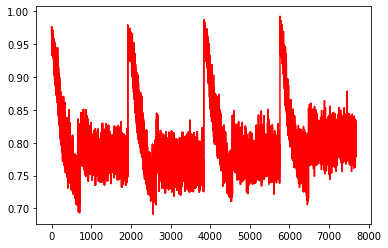

In [10]:
disco.diffuse(text_prompts, batch_name='hawkish', n_samples=4)


In [3]:
disco.make_gif(batch_name='hawkish', batch_num=6, sample_num=3, show=False)

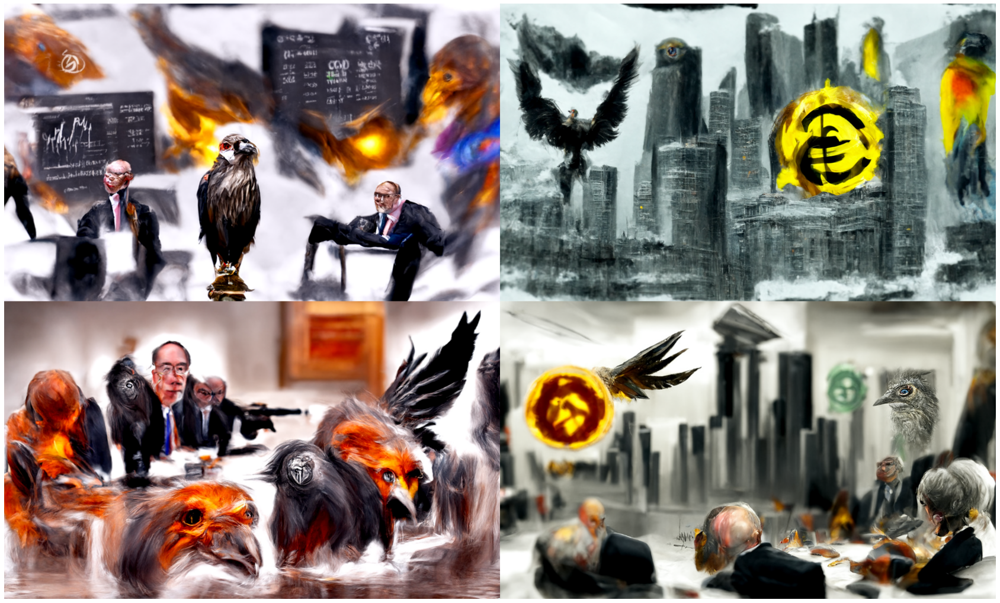

In [5]:
disco.collage(batch_name='hawkish', batch_num=7, ncols=2, num_images=4)